In [1]:
from data_loader import DataLoad_Train
from Model_kernel import ImpedanceModel
import torch
import matplotlib.pyplot as plt
import scipy.io as spio

In [2]:
# Here indicating the GPU you want to use. if you don't have GPU, just leave it.
cuda_available = torch.cuda.is_available()
device = torch.device('cuda:1')
torch.set_default_dtype(torch.float)

In [3]:
sample_length = 40
v_smooth_sigma = 5
results_path = '../results/'

In [4]:
train_data, train_data_v_smooth, train_label, test_data, v_smooth, test_label = DataLoad_Train(sample_length, v_smooth_sigma)

velocity.shape torch.Size([401, 401, 93])
seismic_data.shape torch.Size([401, 401, 93])
train_data.shape torch.Size([40, 93])
train_data_v_smooth.shape torch.Size([40, 93])
label_data.shape torch.Size([40, 93])
test_data.shape torch.Size([401, 401, 93])
test_label.shape torch.Size([401, 401, 93])


In [5]:
model_size = train_data.size()
model_val_size = test_data.size()

In [6]:
torch.std_mean(train_data)

(tensor(0.9871), tensor(0.0003))

In [7]:
in_channels = 1
out_channels = 1
is_batchnorm = False
net = ImpedanceModel(in_channels, out_channels, is_batchnorm)
net.to(device)

ImpedanceModel(
  (layer1): modelConv1(
    (conv1): Sequential(
      (0): Conv1d(1, 16, kernel_size=(31,), stride=(1,), padding=(15,))
      (1): ReLU(inplace=True)
    )
  )
  (group1): Sequential(
    (0): modelConv1(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
    )
    (1): modelResBlock(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
      (conv2): Sequential(
        (0): Conv1d(16, 16, kernel_size=(3,), stride=(1,), padding=(1,))
        (1): ReLU(inplace=True)
      )
    )
  )
  (group2): Sequential(
    (0): modelConv1(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(15,))
        (1): ReLU(inplace=True)
      )
    )
    (1): modelResBlock(
      (conv1): Sequential(
        (0): Conv1d(16, 16, kernel_size=(31,), stride=(1,), padding=(1

In [8]:
# Setup optimiser to perform inversion
optimizer = torch.optim.AdamW(net.parameters())
loss_fn = torch.nn.L1Loss()

0 4.428132057189941
50 0.3905746638774872
100 0.31987401843070984
150 0.24968281388282776
200 0.3109630346298218
250 0.234156996011734
300 0.22808708250522614
350 0.290490984916687
400 0.18727029860019684
450 0.24587313830852509
500 0.1730281114578247
550 0.19695541262626648
600 0.166958749294281
650 0.1543615460395813
700 0.11886633187532425
750 0.10978259146213531
800 0.1935977041721344
850 0.1184002012014389
900 0.10548420995473862
950 0.17572827637195587
1000 0.170199915766716


/tmp/ipykernel_222708/2662917828.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


1050 0.16347208619117737
1100 0.16845595836639404
1150 0.1439388543367386
1200 0.1438329517841339
1250 0.12802916765213013
1300 0.14294719696044922
1350 0.12473666667938232
1400 0.12667670845985413
1450 0.11916805803775787
1500 0.12299566715955734
1550 0.1070401594042778
1600 0.11825397610664368
1650 0.11581245809793472
1700 0.1236022487282753
1750 0.10021863132715225
1800 0.09858699142932892
1850 0.10733490437269211
1900 0.11788909137248993
1950 0.07323355972766876
2000 0.07900333404541016
2050 0.06514696031808853
2100 0.053594913333654404
2150 0.05412501469254494
2200 0.060960423201322556
2250 0.052316565066576004
2300 0.0497143529355526
2350 0.09638675302267075
2400 0.09078115969896317
2450 0.0791490450501442
2500 0.07242663204669952
2550 0.08092086762189865
2600 0.06872621923685074
2650 0.07857415080070496
2700 0.07062865048646927
2750 0.06681466102600098
2800 0.06381967663764954
2850 0.07476459443569183
2900 0.06143759563565254
2950 0.0654289498925209
3000 0.06636781245470047
3050

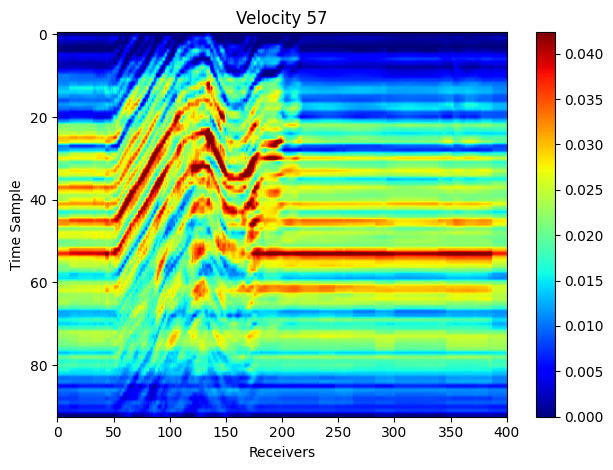

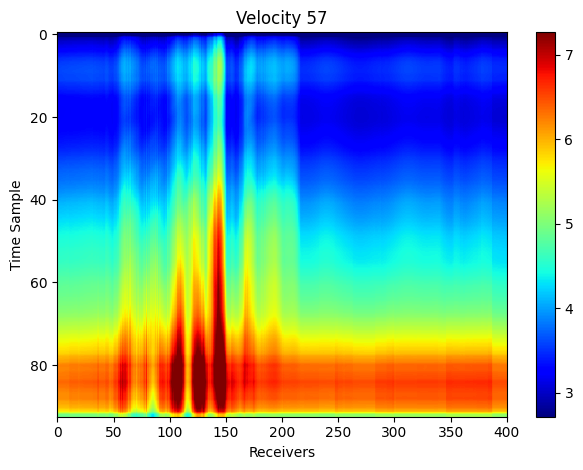

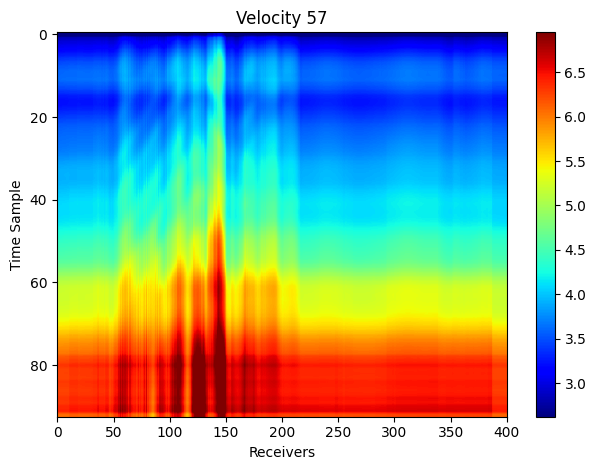

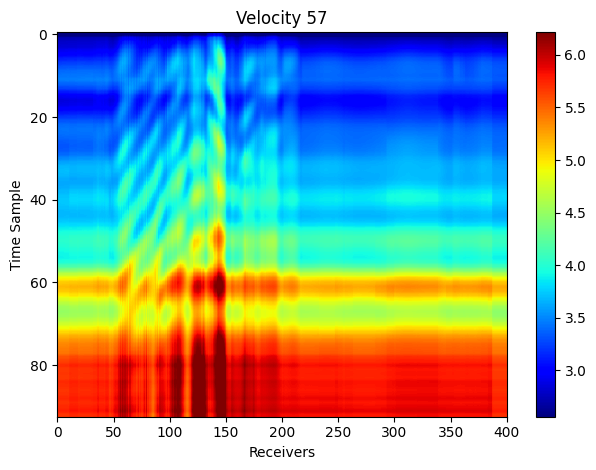

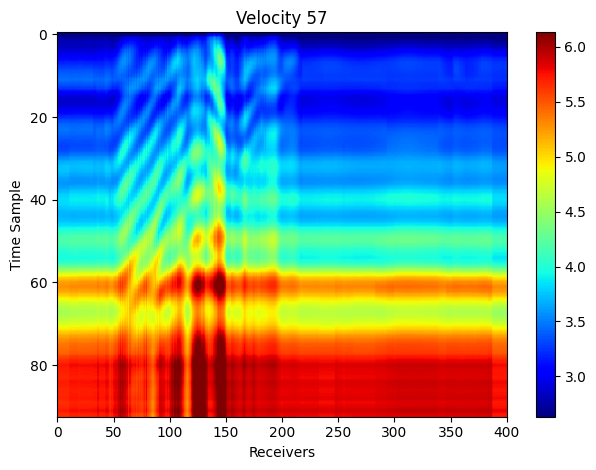

...

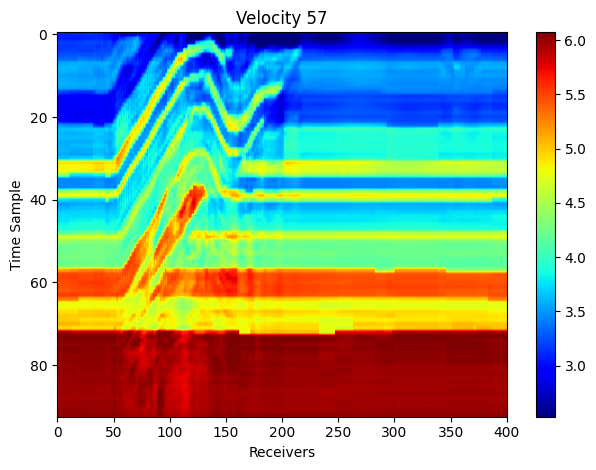

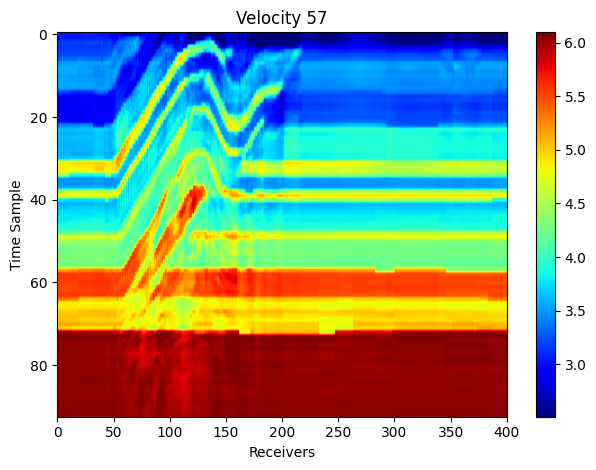

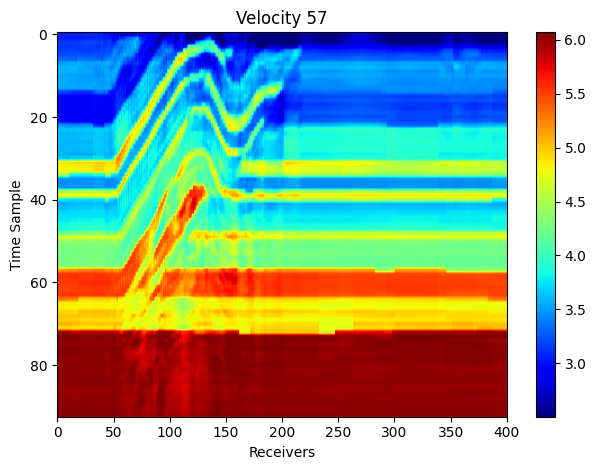

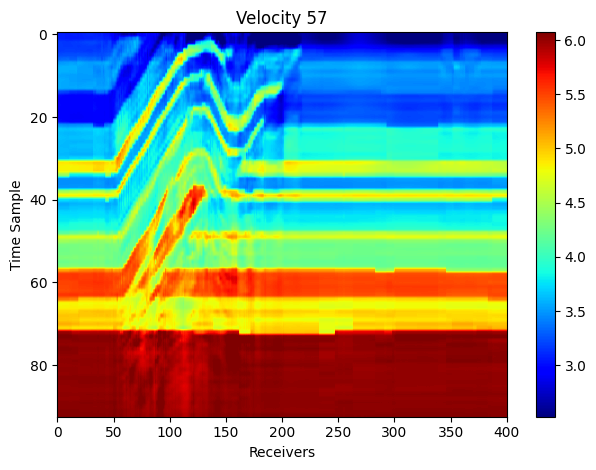

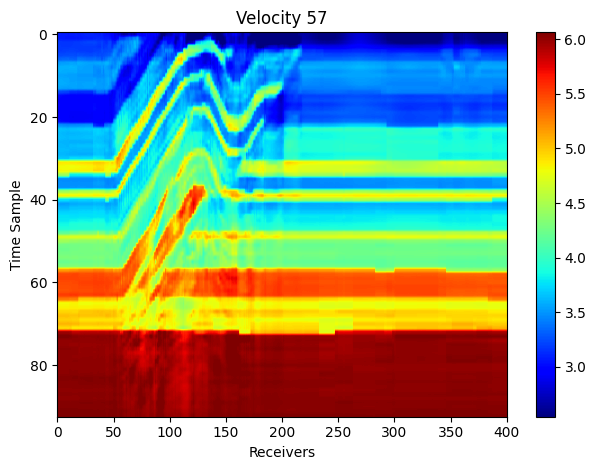

In [9]:
num_epochs = 5000
for epoch in range(num_epochs):
    
    optimizer.zero_grad()
    
    outputs = net(train_data.view(model_size[0], 1, model_size[1]).to(device))
    
    loss = (
            loss_fn(outputs,
                    (train_label.view(model_size[0], 1, model_size[1]).to(device)))
        )
    loss.backward()
    
    optimizer.step()
    
    if epoch % 50 == 0:
        with torch.no_grad():
            print(epoch,loss.item())
            net.eval()
            
            outputs_val = net(test_data.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2]).to(device))
            outputs_val = outputs_val.reshape(model_val_size[0], model_val_size[1], model_val_size[2])
            vmin, vmax = torch.quantile(outputs_val[0,:,:].cpu(), torch.tensor([0.01, 0.99]))
            
            plt.figure()
            plt.imshow(outputs_val[0,:,:].T.cpu(), aspect='auto', cmap='jet', vmax=vmax, vmin=vmin)
            plt.xlabel("Receivers")
            plt.ylabel("Time Sample")
            plt.title("Velocity 57")
            plt.colorbar()

            plt.tight_layout()
            plt.savefig(results_path + str(epoch) + '_pre_velocity.jpg')

In [ ]:
# with torch.no_grad():
#     net.eval()

#     outputs_val = net(test_data.reshape(model_val_size[0]*model_val_size[1], 1, model_val_size[2]).to(device))
#     outputs_val = outputs_val.reshape(model_val_size[0], model_val_size[1], model_val_size[2])
# #     vmin, vmax = torch.quantile(outputs_val[0,:,:].cpu(),
# #                     torch.tensor([0.01, 0.99]))
# #     plt.imshow(outputs_val[0,:,:].T.cpu(), aspect='auto',
# #                  cmap='jet')
# #     plt.xlabel("Receivers")
# #     plt.ylabel("Time Sample")
# #     plt.title("Velocity 57")
# #     plt.colorbar()

# #     plt.tight_layout()
# #     plt.savefig(results_path+'pre_velocity.jpg')
    
#     spio.savemat(results_path + 'pre_velocity.mat',{'pre_velocity':outputs_val.cpu().data.numpy()})